In [ ]:
# Properly install detectron2. (Please do not install twice in both ways)
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-bcq_fbpg
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-bcq_fbpg
  Resolved https://github.com/facebookresearch/detectron2.git to commit 0df2d73d0013db7de629602c23cc120219b4f2b8
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 11.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 48.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 16.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for detectron2: filename=detectron2-0.6-cp310-cp310-linux_x86_64.whl size=6174479 sha256=e01c5e5e15f5c594481146a0018e

In [ ]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  2.3 ; cuda:  cu121
detectron2: 0.6


In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
# if your dataset is in COCO format, this cell can be replaced by the following three lines:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/drive/MyDrive/train.json", "/content/drive/MyDrive/train")
register_coco_instances("my_dataset_val", {}, "/content/drive/MyDrive/val.json", "/content/drive/MyDrive/val")

[05/30 09:15:37 d2.data.datasets.coco]: Loaded 100 images in COCO format from /content/drive/MyDrive/train.json


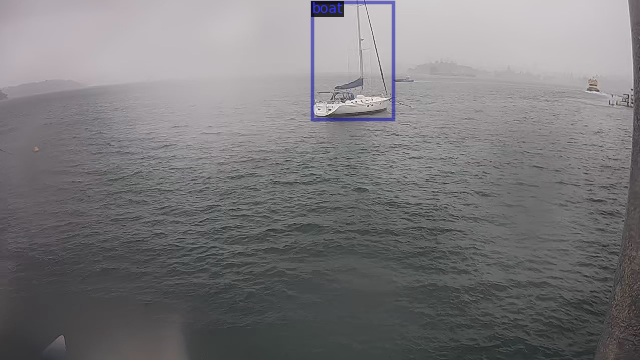

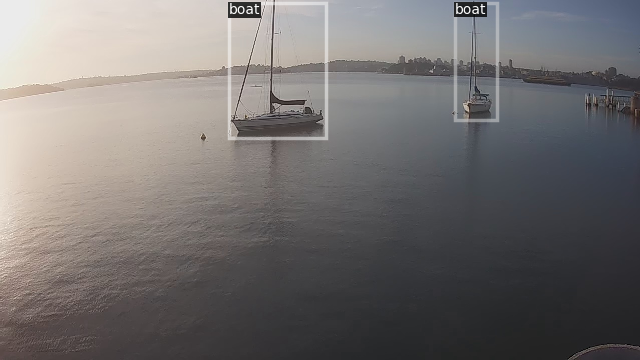

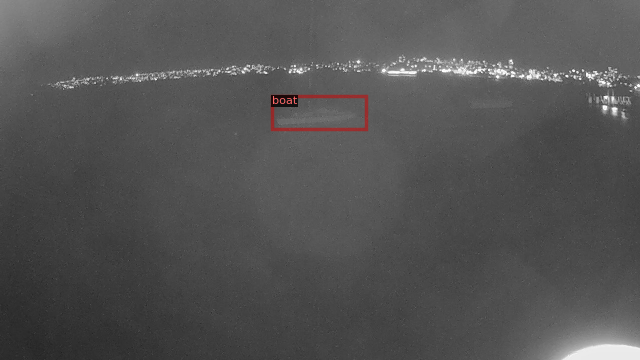

In [ ]:
dataset_dicts = DatasetCatalog.get("my_dataset_train")
metadata = MetadataCatalog.get("my_dataset_train")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

[05/30 09:15:49 d2.data.datasets.coco]: Loaded 100 images in COCO format from /content/drive/MyDrive/val.json


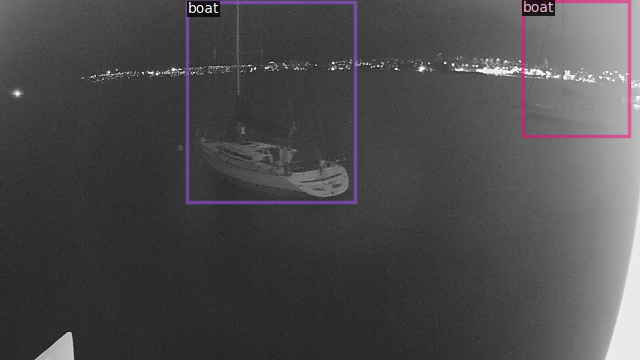

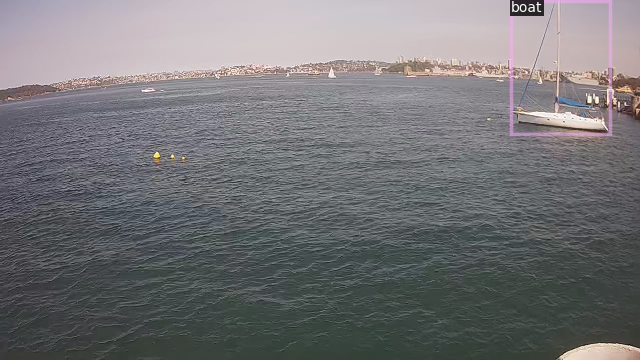

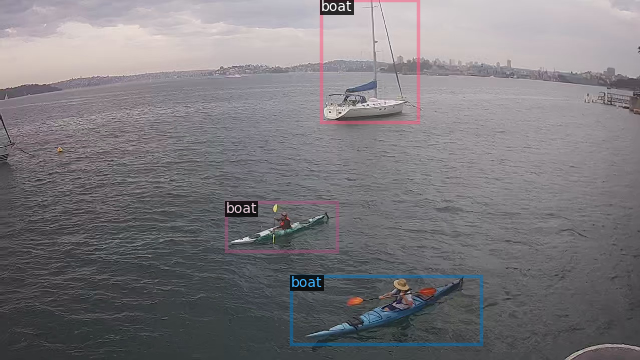

In [ ]:
dataset_dicts = DatasetCatalog.get("my_dataset_val")
metadata = MetadataCatalog.get("my_dataset_val")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
from detectron2.data.datasets import register_coco_instances
from detectron2.config import get_cfg
from detectron2 import model_zoo
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator
from detectron2.data import build_detection_test_loader
from detectron2.evaluation import inference_on_dataset


cfg = get_cfg()
# Load the base configuration for RetinaNet from the model zoo
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))

# Load pretrained weights for RetinaNet from the model zoo
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")

cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model

cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)
cfg.DATALOADER.NUM_WORKERS = 4
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001
cfg.SOLVER.MAX_ITER = 2500
cfg.SOLVER.STEPS = [1500, 2000]
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1 # Adjust the number of classes
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128  # Batch size per image during training

cfg.OUTPUT_DIR = "./output"

class CocoTrainer(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            output_folder = cfg.OUTPUT_DIR
        return COCOEvaluator(dataset_name, cfg, False, output_folder)

trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()




[05/30 09:15:57 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
model_final_280758.pkl: 167MB [00:01, 118MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[05/30 09:15:59 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:512: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3587.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[05/30 09:16:24 d2.utils.events]:  eta: 0:39:28  iter: 19  total_loss: 1.177  loss_cls: 0.6734  loss_box_reg: 0.4498  loss_rpn_cls: 0.04863  loss_rpn_loc: 0.01124    time: 1.0187  last_time: 0.9627  data_time: 0.0645  last_data_time: 0.0147   lr: 1.9981e-05  max_mem: 4689M
[05/30 09:16:48 d2.utils.events]:  eta: 0:39:54  iter: 39  total_loss: 1.08  loss_cls: 0.486  loss_box_reg: 0.5269  loss_rpn_cls: 0.04641  loss_rpn_loc: 0.01052    time: 1.0015  last_time: 1.0066  data_time: 0.0270  last_data_time: 0.0278   lr: 3.9961e-05  max_mem: 4689M
[05/30 09:17:08 d2.utils.events]:  eta: 0:40:24  iter: 59  total_loss: 0.9249  loss_cls: 0.3577  loss_box_reg: 0.5214  loss_rpn_cls: 0.03026  loss_rpn_loc: 0.01014    time: 1.0040  last_time: 1.0392  data_time: 0.0258  last_data_time: 0.0116   lr: 5.9941e-05  max_mem: 4690M
[05/30 09:17:29 d2.utils.events]:  eta: 0:40:39  iter: 79  total_loss: 0.9555  loss_cls: 0.3189  loss_box_reg: 0.6005  loss_rpn_cls: 0.02194  loss_rpn_loc: 0.008251    time: 1.022

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/30 10:00:01 d2.evaluation.evaluator]: Inference done 11/100. Dataloading: 0.0040 s/iter. Inference: 0.1371 s/iter. Eval: 0.0004 s/iter. Total: 0.1415 s/iter. ETA=0:00:12
[05/30 10:00:06 d2.evaluation.evaluator]: Inference done 43/100. Dataloading: 0.0161 s/iter. Inference: 0.1384 s/iter. Eval: 0.0007 s/iter. Total: 0.1557 s/iter. ETA=0:00:08
[05/30 10:00:11 d2.evaluation.evaluator]: Inference done 84/100. Dataloading: 0.0099 s/iter. Inference: 0.1288 s/iter. Eval: 0.0005 s/iter. Total: 0.1396 s/iter. ETA=0:00:02
[05/30 10:00:13 d2.evaluation.evaluator]: Total inference time: 0:00:13.108009 (0.137979 s / iter per device, on 1 devices)
[05/30 10:00:13 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:12 (0.127119 s / iter per device, on 1 devices)
[05/30 10:00:13 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/30 10:00:13 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[05/30 10:00:13 d2.evaluation.coco_

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

[05/30 10:10:23 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...
[05/30 10:10:23 d2.data.datasets.coco]: Loaded 100 images in COCO format from /content/drive/MyDrive/val.json


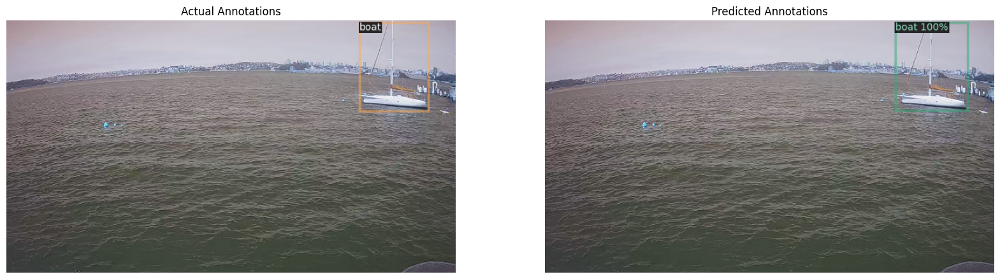

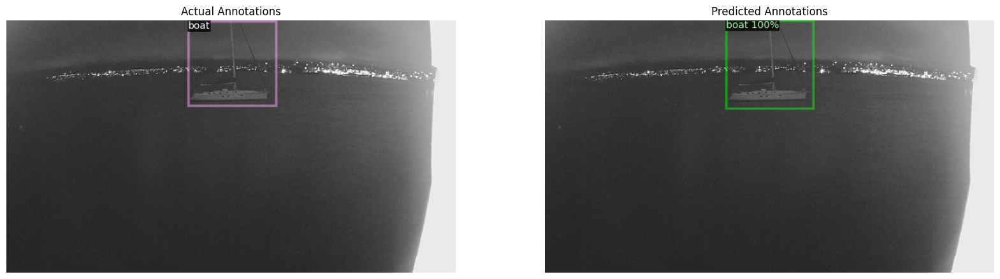

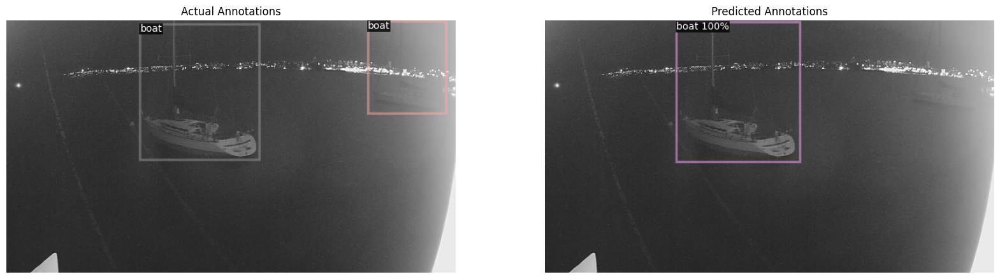

In [ ]:
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.engine import DefaultPredictor
import cv2
from matplotlib import pyplot as plt
import random

# 确保模型和配置已经加载
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)

# 加载测试数据集
dataset_dicts = DatasetCatalog.get("my_dataset_val")
metadata = MetadataCatalog.get("my_dataset_val")

# 随机选择3张图进行可视化
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    outputs = predictor(img)

    # 显示实际标注
    visualizer = Visualizer(img[:, :, ::-1], metadata=metadata, scale=0.5)
    vis_true = visualizer.draw_dataset_dict(d)

    # 显示预测结果
    visualizer = Visualizer(img[:, :, ::-1], metadata=metadata, scale=0.5, instance_mode=ColorMode.IMAGE)
    vis_pred = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))

    # 将实际标注和预测结果并排展示
    fig, ax = plt.subplots(1, 2, figsize=(20, 10))
    ax[0].imshow(vis_true.get_image()[:, :, ::-1])
    ax[0].set_title("Actual Annotations")
    ax[0].axis('off')
    ax[1].imshow(vis_pred.get_image()[:, :, ::-1])
    ax[1].set_title("Predicted Annotations")
    ax[1].axis('off')
    plt.show()
